# Importing Necessary Libraries

In [5]:
#Libraries for Numeric analysis
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split as tts

#Libraries for Visual representation of data
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#Library to remove uncecessary waarnings messages.
import warnings
warnings.filterwarnings('ignore')

# Loading the data set and pre-processing it

1. In the dataset, the entries were not in separate columns so firstly the
  data was split wherever there was space and then was added into different columns.
2. The Target and Input Columns were identified with reference from the provided website for the dataset.

3. KINF(K infinity) stands for Infinite Multiplication Factor and PPPF stands for Pin Power Peaking Factor.


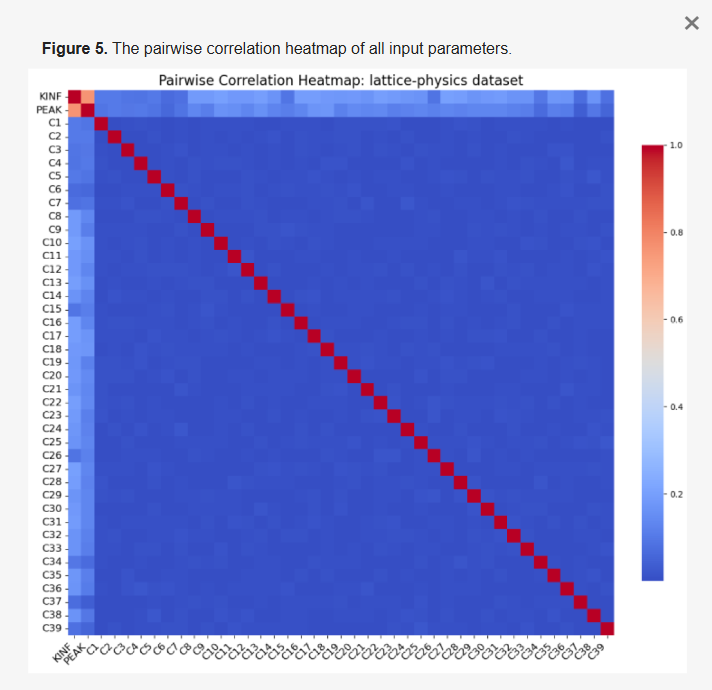

*AI use in the code below*

In [6]:
df=pd.read_csv('raw.csv', header=None)
print(df.shape)

#Convert the single row of space-separated values into multiple columns
df=pd.DataFrame(df[0].str.split(' ').tolist())

#Rename columns
column_names=['KINF', 'PPPF'] + [f'C{i}' for i in range(1, df.shape[1] - 1)]
df.columns=column_names[:df.shape[1]]


#Save the resulting DataFrame to a new CSV file named "processed.csv"
df.to_csv('processed.csv', index=False)
df_1=pd.read_csv('processed.csv')
print(df_1.shape)

df_1.drop("C40", axis=1, inplace=True)
df.to_csv('processed.csv', index=False)
print(df_1.shape)

(24000, 1)
(24000, 42)
(24000, 41)


Viewing the First 5 entries of the Data set

In [ ]:
df_1.columns

Index(['KINF', 'PPPF', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9',
       'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19',
       'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29',
       'C30', 'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37', 'C38', 'C39'],
      dtype='object')

In [ ]:
df_1.head()

,KINF,PPPF,C1,C2,C3,C4,C5,C6,C7,C8,...,C30,C31,C32,C33,C34,C35,C36,C37,C38,C39
0,1.32630,1.862086,3.562615,1.112359,4.208065,1.412679,2.271031,3.950614,3.627032,4.600332,...,3.965987,4.030999,0.826347,2.088521,4.088550,1.184149,2.780985,2.865400,4.773820,3.539373
1,1.34149,1.786558,2.354766,1.047929,2.268974,4.637777,3.793194,2.859702,4.361058,3.592485,...,2.228000,4.837370,2.846538,3.413201,4.154079,4.700800,3.597879,4.681148,3.215494,3.972672
2,1.33034,1.826187,3.037997,4.719517,1.502280,3.644736,3.575727,1.337686,2.380347,4.503771,...,2.615278,3.757999,3.161658,4.996056,3.339642,2.548468,4.417111,1.375554,4.363320,2.988546
3,1.35653,1.739225,4.412804,2.220680,3.132738,1.327124,4.759890,2.882082,3.663430,4.531524,...,3.899026,1.018926,4.379308,3.280298,3.916281,3.179922,3.769315,0.849544,2.508179,0.912272
4,1.30190,1.955829,2.790669,0.798177,1.231750,1.977844,2.393930,4.738126,1.364743,3.391665,...,3.641512,1.564076,2.178406,2.754888,4.007165,0.702069,4.064682,1.370575,0.769475,1.395959


# Creating a Co-relation matrix

With the help of the co-relation matrix we can see how a particular dataset effects the values of other dataset.
Sign of the co-relation matrix shows proportionality or inverse-proportionality.



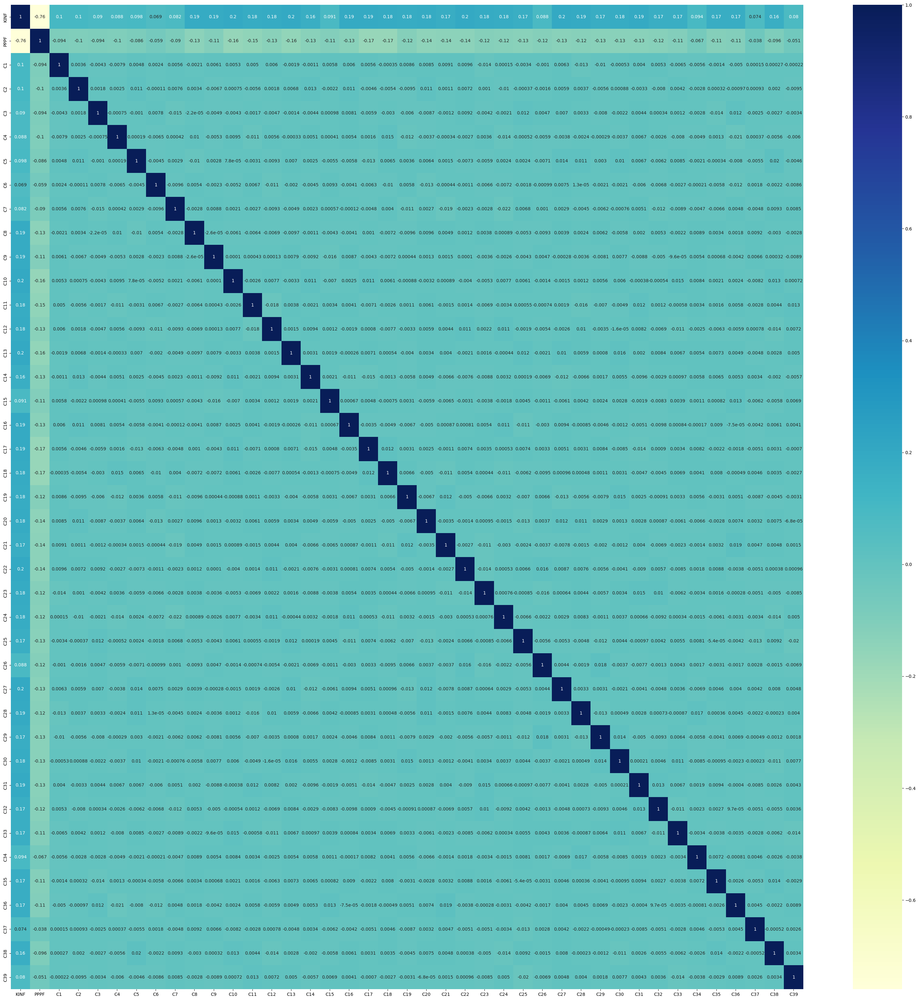

In [ ]:
Nuclear=df_1.select_dtypes(include=['number'])
plt.figure(figsize=(40,40))
sns.heatmap(Nuclear.corr(), cmap='YlGnBu',annot=True)
plt.show()

**Interesting features of Co-relation matrix**
1. Co-relation between KINF and PPPF is significantly high as compared to other features. So If i can predict one of the feature with great accuracy, it will help in preddicting the other.

2. With respect to KINF all features except few have significant contribution.

3. The co-relation between the features themselves is low, indicating Non-colinearity. Non-colinearity means the inter-dependence between features is so each feature add more value to it's prediction(Less over-lapping reduces chances for over-fitting).


**The code block below aims to create subplots indicating relation between all 39 features v/s KINF and PPPF**

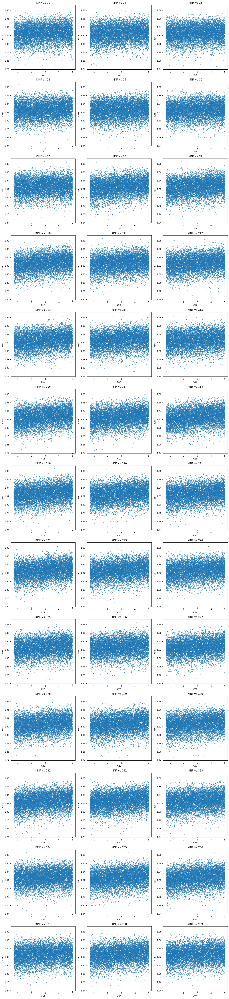

In [ ]:
target='KINF'
features=['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9',
       'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19',
       'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29',
       'C30', 'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37', 'C38', 'C39']

# Define the layout for subplots
n_features=len(features)
n_rows=(n_features ) // 3  # Adjust rows for 3 columns per row

# Create the subplots
fig, axes=plt.subplots(n_rows, 3, figsize=(15, 5 * n_rows))
axes=axes.flatten()

# Plot each feature against KINF
for i, feature in enumerate(features):
    axes[i].scatter(df_1[feature], df_1[target], alpha=0.8,s=1)
    axes[i].set_title(f"KINF vs {feature}")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('KINF')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

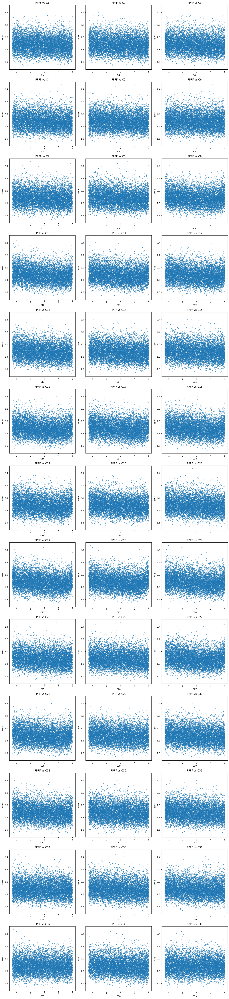

In [ ]:
target='PPPF'
features=['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9',
       'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19',
       'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29',
       'C30', 'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37', 'C38', 'C39']

# Define the layout for subplots
n_features=len(features)
n_rows=(n_features ) // 3  # Adjust rows for 3 columns per row

# Create the subplots
fig, axes=plt.subplots(n_rows, 3, figsize=(15, 5 * n_rows))
axes=axes.flatten()

# Plot each feature against KINF
for i, feature in enumerate(features):
    axes[i].scatter(df_1[feature], df_1[target], alpha=0.8,s=1)
    axes[i].set_title(f"PPPF vs {feature}")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('PPPF')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

# Exploring Different Models for predicting KINF

**This section is dedicated in exploring model for predicting value for PPPF**

**As this was a prediction problem and not a classification, The first method that came into my mind was using Linear Regression and also it is very easy to implement so I can judge the performance and decide if I should move onto try another model.**

In [ ]:
X=df_1.drop(columns=['KINF','PPPF'])
Y=df_1['KINF']

Creating The train and test data
:One helps to train and the other helps to assert the performance

In [ ]:
X_train,X_test,Y_train,Y_test,=tts(X,Y,test_size=0.3,random_state=64)

1.The Linear Regression model was created and Trained.

2.Using the model predictions were made on X_test data.

In [ ]:
#Library to Perform Linear Regression.
from sklearn.linear_model import LinearRegression

LoG=LinearRegression()
LoG.fit(X_train,Y_train)

LinearRegression()

In [ ]:
#Generating Predicted Values
Y_predicted=LoG.predict(X_test)
print(Y_predicted)

[1.33770027 1.34539565 1.31009928 ... 1.34702934 1.32484814 1.31701696]


A Scatter plot was used on Y_test and Y_predicted to visualize the performance of the model.

1.It can be observed that the predicted value(Y_predicted) were quite close to actual value(Y_test).

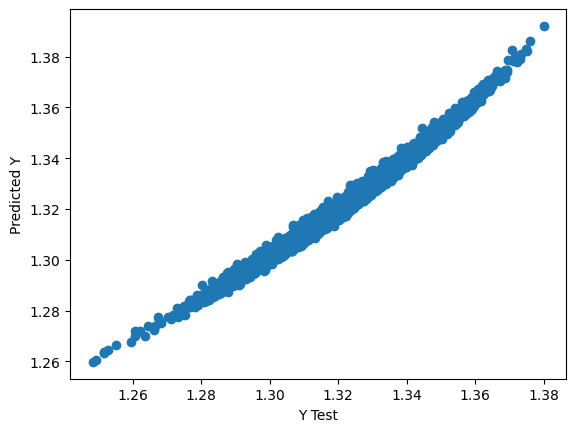

In [ ]:
plt.scatter(Y_test.reset_index(drop=True),Y_predicted)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

This above Scatter plot suggests that the Linear Regression Model worked well for predicting KINF value.

In [ ]:
#Library for Performance Assesment.
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import r2_score as RMSE
from sklearn.metrics import mean_absolute_error as MAE

print(f'Test Mean Absolute Error: {MAE(Y_test,Y_predicted)}\nTest Mean Squared Error: {MSE(Y_test,Y_predicted)}\nRMSE: {RMSE(Y_test,Y_predicted)}')

MAE: 0.0015543539564988862
MSE: 4.107954599844799e-06
RMSE: 0.9867682326969905


# Model's performance
**Metrics such as Mean Squared Error, R2(R squared) and Mean Absolute Error used.**

1. Mean Absolute Error is a measure of the average size of the mistakes in a
  collection of predictions.

 It suggests that on average, model's predictions are off by about 0.001554 units, considering that the scale of Values of KINF this much error is tolerable(around 0.11% error).

2. Mean squared error is a metric used to measure the average squared
  difference between the predicted values and the actual values.

  A very small value (4.10e-06) shows that the squared errors are tiny, meaning the model's predictions are quite accurate.

3. R-Squared a metric in a regression model that determines the proportion  of variance in the dependent variable(how well the data fit the regression model).

  An R² of 0.9867 means model explains about 98.68% of the variability, which is excellent.


 **Combined Evalution:

~With an R² of 0.9867, your model is highly predictive.

~The low MAE (0.001554) and MSE (4.10e-06) confirm that your model is
  accurate.

~Together, these metrics indicate that model is not only explaining  
  the variance but also making precise predictions.



**Conclusion: As the Linear Regression Model Performed good, it would be my final solution for KINF Prediction**

As KINF was accurately predicted I can use it in predicting PPPF.

# Predicting PPPF Value

**This section is dedicated in exploring model for predicting value for PPPF**

**First choice was a Linear Regression Model**


In [ ]:
#Creating datasets
X=df_1.drop(columns=['PPPF'])
Z=df_1['PPPF']

The code block below is used to automatically select specified number of top contributing factors to the required Target using something called F-statistics.
In a way I have introduced a Hyper parameter for Linear regression.

In [ ]:
from sklearn.feature_selection import SelectKBest, f_regression
num_features=25
selector=SelectKBest(score_func=f_regression, k=num_features)
X_selected=selector.fit_transform(X, Z)

After Trying different values of "num_features" conclusion was that the outcome didn't change by much.

In [ ]:
from sklearn.model_selection import train_test_split as tts
X_train,X_test,Z_train,Z_test=tts(X_selected,Z,test_size=0.3,random_state=64)

Creating the Linear Regression Model

In [ ]:
from sklearn.linear_model import LinearRegression

LoG2=LinearRegression()
LoG2.fit(X_train,Z_train)

LinearRegression()

Predicting the values

In [ ]:
Z_predicted=LoG2.predict(X_test)
print(Z_predicted)

[1.82082587 1.78215986 1.95857269 ... 1.78318599 1.89974569 1.92176968]


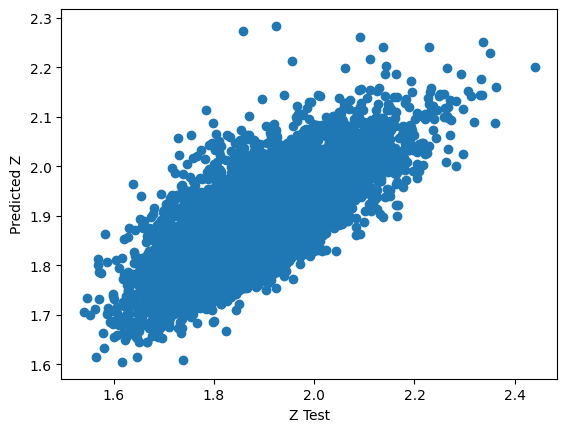

In [ ]:
plt.scatter(Z_test.reset_index(drop=True),Z_predicted)
plt.xlabel('Z Test')
plt.ylabel('Predicted Z')
plt.show()

In [ ]:
#Library for Performance Assesment.
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import r2_score as RMSE
from sklearn.metrics import mean_absolute_error as MAE

print(f'Test Mean Absolute Error: {MAE(Z_test,Z_predicted)}\nTest Mean Squared Error : {MSE(Z_test,Z_predicted)}\nRMSE: {RMSE(Z_test,Z_predicted)}')

MAE: 0.05974822289654387
MSE: 0.005945713007943608
RMSE: 0.5849218163069991


# Model's Performance

1. As compared to the Linear Regression Model for KINF, this Linear regression model didnt perforn that well.
2. The could be that their is not an exact linear relationship between the features and the Target variable, their may be some other type of dependance between them.
3. It is clear from the Perfromance metrics that their is need for a better model for perdicting PPPF.

**Implementing a CNN model for the prediction of PPPF**


During my research on the dataset available on the provided website, I noted that the researchers initially utilized a Convolutional Neural Network (CNN) model for their predictive analysis.

I have used Tensorflow framework to make the CNN model.



In [3]:
#Importing necessary Libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential

#These LIbraries are used for creating the CNN architecture.
from tensorflow.keras.layers import Conv1D, Flatten, Dense, Dropout, Input, LeakyReLU, BatchNormalization

#This Library is used to Normalize the the dataset which is part of pre-processing.
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [4]:
X=df_1.drop(columns=['PPPF'])
Z=df_1['PPPF']

#Agian This code snippet aims to select the top performing featues.
#In this case after trying many value for "num_features" 39 came out to be the best(It didnt really help).
from sklearn.feature_selection import SelectKBest, f_regression
num_features=39
selector=SelectKBest(score_func=f_regression, k=num_features)
X_selected=selector.fit_transform(X, Z)

X_train,X_test,Z_train,Z_test,=tts(X_selected,Z,test_size=0.3,random_state=64)

In [5]:
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

# Reshape input for CNN (add a channel dimension for Conv1D).A Conv1D layer expects input data to have a 3-dimensional shape
X_train_cnn=np.expand_dims(X_train, axis=-1)
X_test_cnn=np.expand_dims(X_test, axis=-1)
print(X_train_cnn.shape)
print(X_test_cnn.shape)

(16800, 39, 1)
(7200, 39, 1)


**For the CNN Model I have also performed hyper parametric tuning, in another notebook**

1. First I tried Using GridSearchCV for tuning the Model, but due to some technical problem(even CHAT GPT couldnt resolve) I had to drop it.  

2. Then I used Optuna for Hyperparametric Tuning. Optuna iteratively evaluates different hyperparameter combinations by sampling from the defined search space.
3. It kind of worked, then i tweaked the parameter manually and got slightly better result.

**This is the Final Architecture for the CNN Model**

*AI use in the code block below (early_stopping and lr_scheduler)*

**early_stopping**: This callback stops training early when the model’s performance on the validation set stops improving.

**lr_scheduler**: This callback reduces the learning rate when the model's performance on the validation set stops improving.


In [10]:
#L2 regularization is a technique used to prevent overfitting in machine learning models.
#Id does so by adding a penalty to the loss function based on the squared magnitude of the model's weights.(Learning from mistakes)
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#CNN model's Architecture.
model=Sequential([
        Input(shape=(X_train_cnn.shape[1], X_train_cnn.shape[2])),
        Conv1D(128, kernel_size=3,activation='relu'),
        Dropout((0.2)),
        Conv1D(64, kernel_size=3,activation='relu'),#pehale 64 tha
        Dropout((0.2)),
        Flatten(),
        Dense(64, kernel_regularizer=l2(0.1),activation='relu'),
        Dropout((0.2)),
        Dense(32,activation='relu'),
        Dense(1)
])

#Compiling the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse'])

#Adding callbacks for training
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)

#Training the model
history=model.fit(
    X_train_cnn, Z_train,
    validation_data=(X_test_cnn, Z_test),
    epochs=100,
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping, lr_scheduler]
)

#Evaluating the model based on Mean Absolute error.
loss, mae, mse = model.evaluate(X_test_cnn, Z_test, verbose=1)
print(f"Test Mean Absolute Error: {mae}")
print(f"Test Mean Squared Error (MSE): {mse}")

Epoch 1/100
525/525 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 2.1133 - mae: 0.2767 - mse: 0.1934 - val_loss: 0.0215 - val_mae: 0.0852 - val_mse: 0.0113 - learning_rate: 0.0010
Epoch 2/100
525/525 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0371 - mae: 0.1328 - mse: 0.0280 - val_loss: 0.0160 - val_mae: 0.0881 - val_mse: 0.0114 - learning_rate: 0.0010
Epoch 3/100
525/525 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0211 - mae: 0.1037 - mse: 0.0170 - val_loss: 0.0123 - val_mae: 0.0822 - val_mse: 0.0105 - learning_rate: 0.0010
Epoch 4/100
525/525 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0122 - mae: 0.0804 - mse: 0.0104 - val_loss: 0.0079 - val_mae: 0.0623 - val_mse: 0.0063 - learning_rate: 0.0010
Epoch 5/100
525/525 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0099 - mae: 0.0719 - mse: 0.0083 - val_loss: 0.0086 - val_mae: 0.0632 - val_mse: 0.0066 - learning_rate: 0.0010
Epoch 6/100
525/525 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0099 - mae: 0.0712 - mse: 0.0081 - val_loss: 0.0086 - val_mae:

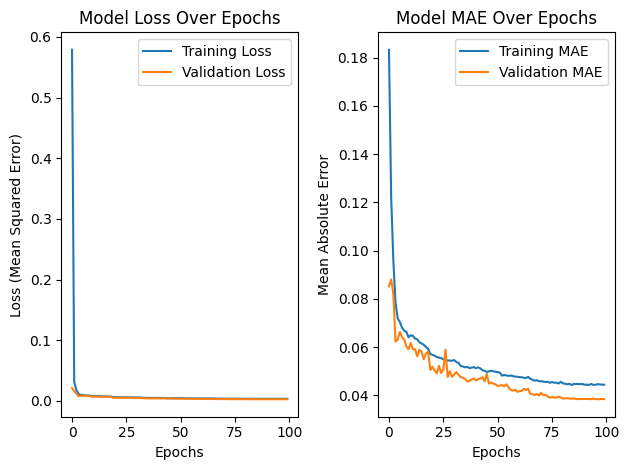

In [11]:
#Plot Loss(Mean Squared Error)
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss (Mean Squared Error)')
plt.legend()

#Plot MAE
plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Model MAE Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

plt.tight_layout()
plt.show()

#Model's Performance

1. The Mean Absolute Error and Mean Squared Error both value have imporved as compared to the Linear Regression Model, but still their is chance of improvement.
2. Another model can be tested in hope of getting better results.

# Polnomial Regressor

Importing necessary libraries

In [2]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import make_scorer, mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression

In [7]:
#Load and preprocess data
data=pd.read_csv('processed.csv')
data_cleaned=data.drop(columns=["C40"])  # Drop the null column
X=data_cleaned.drop(columns=["PPPF"])
y=data_cleaned["PPPF"]

*AI use in the below code block for implementing GridSearchCV*

For selecting the parameters to be varied in the GridSearchCV:
1. I had already tried a 2 degree polynomial regressor for many values of "feature_selection__k" so tried for lesser value of the "feature_selection__k".
2. I didn't put in degree 4 polynomial regressor because, i tried it manually earlier and the training session crashed due to limited resource.

In [ ]:
#Define pipeline components
pipeline=Pipeline([
    ('feature_selection', SelectKBest(score_func=f_regression)),
    ('poly_features', PolynomialFeatures(include_bias=False)),
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

#Setting up parameter grid for GridSearchCV
param_grid={
    'feature_selection__k': [ 25, 30, 35],  # Number of top features to select
    'poly_features__degree': [2,3]             # Polynomial degrees to test
}

#Defining scoring metric (MSE)
scorer=make_scorer(mean_squared_error, greater_is_better=False)

#Performing GridSearchCV
grid_search=GridSearchCV(pipeline, param_grid, scoring=scorer, cv=3, verbose=1)
grid_search.fit(X, y)

#Display results of GridSearchCV
best_params=grid_search.best_params_
best_model=grid_search.best_estimator_
best_score=grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Cross-Validated MSE:", -best_score)


Fitting 3 folds for each of 6 candidates, totalling 18 fits


**From the Above Hyperparametric tuning impementation the model had almost reached it's optimised values**

I have tweaked Those values a little but manually to improve it a bit.

In [11]:
#Feature selection (reduce dimensionality)
num_features=30
selector=SelectKBest(score_func=f_regression, k=num_features)
X_selected=selector.fit_transform(X, y)

#Split into training and testing sets
X_train, X_test, y_train, y_test=tts(X_selected, y, test_size=0.25, random_state=42)

In [12]:
#Applying polynomial transformation
degree=3
poly=PolynomialFeatures(degree=degree, include_bias=False)
X_train_poly=poly.fit_transform(X_train)
X_test_poly=poly.transform(X_test)

#Standardize the features
scaler=StandardScaler()
X_train_poly_scaled=scaler.fit_transform(X_train_poly)
X_test_poly_scaled=scaler.transform(X_test_poly)


In [13]:
#Training and evaluate the model
model = LinearRegression()
model.fit(X_train_poly_scaled, y_train)

y_pred=model.predict(X_test_poly_scaled)
mse=mean_squared_error(y_test, y_pred)
mae=mean_absolute_error(y_test, y_pred)
r2=r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R² Score: {r2}")


Mean Squared Error: 0.0039394654093352155
Mean Absolute Error (MAE): 0.04957756974168113
R² Score: 0.7309779583183141


# Model's Performance

1. As Compared to CNN Model the Polynomial regressor didn't performed better.
2. A reason could be that their would be no appropriate 2 degree polynomial thats best describes the relationship.

# Conclusion

 As the CNN Model performed better in predicting the values for PPPF as compared to other tested models, My final submission for the PPPF prediction will be CNN Regressor.